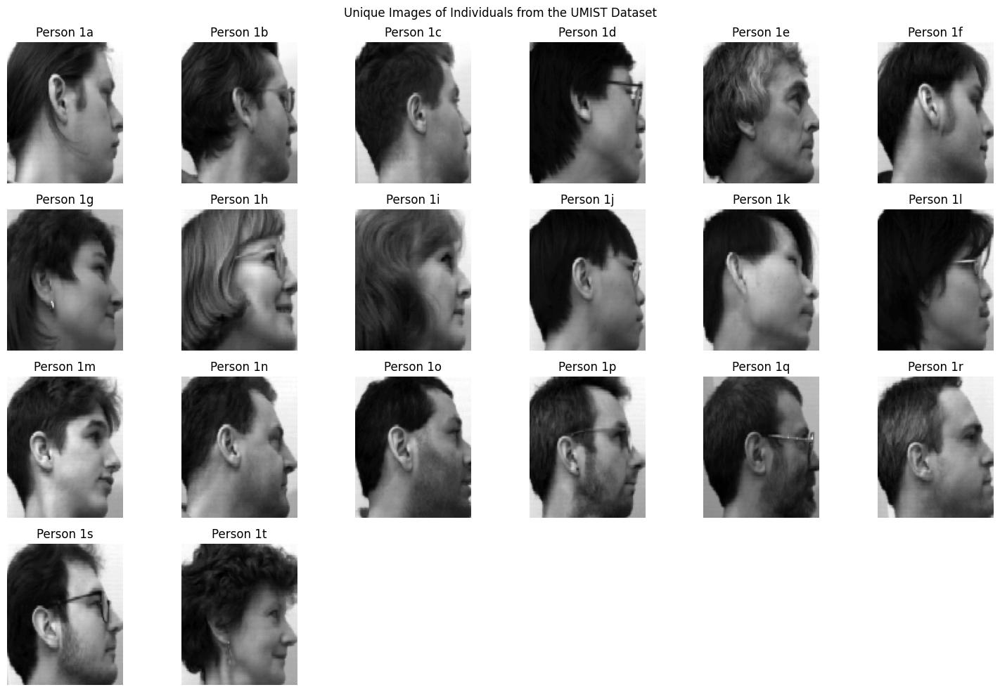

In [101]:
import scipy.io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image

df = pd.read_csv('../Dataset/umist_faces.csv')


unique_labels = df['label'].unique()

image_height, image_width = 112, 92

plt.figure(figsize=(15, 10))
for i, label in enumerate(unique_labels):
    person_image = df[df['label'] == label].iloc[0, 1:].values.astype(float).reshape(image_height, image_width)
    
    plt.subplot(4, 6, i + 1)
    plt.imshow(person_image, cmap='gray')
    plt.axis('off')
    plt.title(f"Person {label}")

plt.suptitle("Unique Images of Individuals from the UMIST Dataset")
plt.tight_layout()
plt.show()


In [102]:
df.shape

(575, 10305)

In [103]:
duplicates = df.duplicated()
num_duplicates = duplicates.sum()

duplicates = df[duplicates]


if not duplicates.empty:
    print(f"Found {len(duplicates)} duplicate rows:")
    print(duplicates)
else:
    print("No duplicate rows found in the DataFrame.")

Found 10 duplicate rows:
   label  pixel_0  pixel_1  pixel_2  pixel_3  pixel_4  pixel_5  pixel_6  \
63    1b    230.0    230.0    232.0    230.0    233.0    232.0    232.0   
64    1b    233.0    232.0    233.0    232.0    233.0    234.0    230.0   
65    1b    234.0    233.0    234.0    234.0    234.0    233.0    234.0   
66    1b    233.0    233.0    234.0    233.0    233.0    234.0    234.0   
67    1b    234.0    233.0    234.0    234.0    234.0    233.0    234.0   
68    1b    234.0    233.0    234.0    234.0    234.0    234.0    234.0   
69    1b    234.0    234.0    233.0    234.0    233.0    234.0    233.0   
70    1b    234.0    234.0    234.0    234.0    234.0    234.0    234.0   
71    1b    234.0    234.0    234.0    234.0    234.0    234.0    232.0   
72    1b    221.0    209.0    140.0     86.0     83.0     74.0     66.0   

    pixel_7  pixel_8  ...  pixel_10294  pixel_10295  pixel_10296  pixel_10297  \
63    232.0    229.0  ...        113.0        122.0        127.0    

In [104]:
if num_duplicates > 0:
    df = df.drop_duplicates()
    print(f"Duplicates removed. New dataset shape: {df.shape}")
else:
    print("No duplicates found in the dataset.")

Duplicates removed. New dataset shape: (565, 10305)


In [105]:
missing_values = df.isnull().sum().sum()
if missing_values > 0:
    print(f"Dataset contains {missing_values} missing values. Cleaning is required.")
    df = df.dropna()
else:
    print("No missing values found in the dataset.")

No missing values found in the dataset.


Label distribution:
 label
1s    48
1a    38
1l    34
1k    34
1t    34
1r    33
1j    32
1n    30
1e    26
1m    26
1p    26
1q    26
1c    26
1b    25
1d    24
1f    23
1h    22
1i    20
1g    19
1o    19
Name: count, dtype: int64


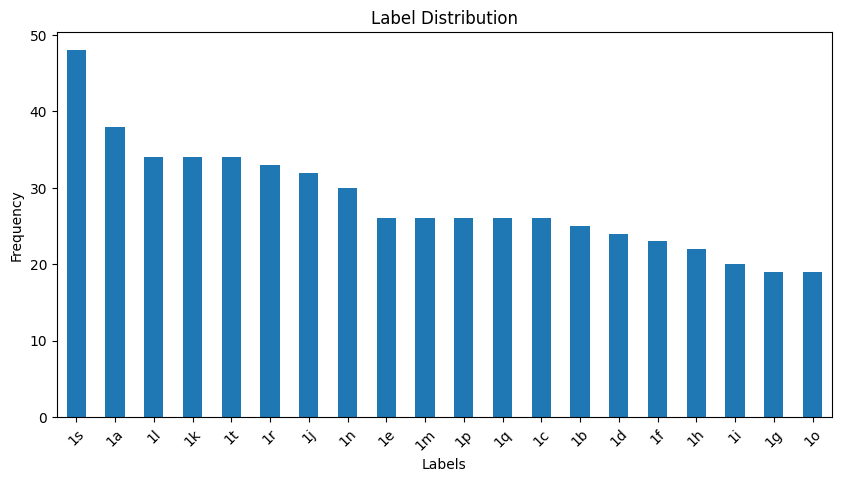

In [106]:
# Check for label distribution
label_counts = df['label'].value_counts()
print("Label distribution:\n", label_counts)

# Plot the distribution
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
label_counts.plot(kind='bar')
plt.title("Label Distribution")
plt.xlabel("Labels")
plt.ylabel("Frequency")
plt.xticks(rotation=45)
plt.show()


In [107]:
from sklearn.utils import resample

max_count = label_counts.max()
balanced_data = []
for label in label_counts.index:
    class_data = df[df['label'] == label]
    balanced_class_data = resample(class_data, replace=True, n_samples=max_count, random_state=42)
    balanced_data.append(balanced_class_data)

df_balanced = pd.concat(balanced_data)
print("Balanced dataset label distribution:\n", df_balanced['label'].value_counts())


Balanced dataset label distribution:
 label
1s    48
1a    48
1g    48
1i    48
1h    48
1f    48
1d    48
1b    48
1c    48
1q    48
1p    48
1m    48
1e    48
1n    48
1j    48
1r    48
1t    48
1k    48
1l    48
1o    48
Name: count, dtype: int64


In [108]:
labels = df_balanced['label'].values
pixels = df_balanced.drop('label', axis=1).values

images = pixels.reshape(-1, image_height, image_width).astype(np.float32)
images /= 255.0

In [109]:
images.shape, labels.shape

((960, 112, 92), (960,))

In [125]:
from sklearn.model_selection import train_test_split

train_images, remaining_images, train_labels, remaining_labels = train_test_split(
    images, labels, test_size=0.4, stratify=labels, random_state=32
)

test_images, val_images, test_labels, val_labels = train_test_split(
    remaining_images, remaining_labels, test_size=0.5, stratify=remaining_labels, random_state=32
)

{
    "Train set": len(train_images),
    "Validation set": len(val_images),
    "Test set": len(test_images)
}


{'Train set': 576, 'Validation set': 192, 'Test set': 192}

In [126]:
def label_distribution(labels, set_name):
    unique, counts = np.unique(labels, return_counts=True)
    print(f"{set_name} label distribution: {dict(zip(unique, counts))}")

label_distribution(train_labels, "Train")
label_distribution(val_labels, "Validation")
label_distribution(test_labels, "Test")

Train label distribution: {'1a': 29, '1b': 29, '1c': 29, '1d': 28, '1e': 29, '1f': 28, '1g': 29, '1h': 28, '1i': 29, '1j': 29, '1k': 29, '1l': 28, '1m': 29, '1n': 29, '1o': 29, '1p': 29, '1q': 29, '1r': 29, '1s': 29, '1t': 29}
Validation label distribution: {'1a': 9, '1b': 9, '1c': 9, '1d': 10, '1e': 10, '1f': 10, '1g': 9, '1h': 10, '1i': 10, '1j': 10, '1k': 10, '1l': 10, '1m': 10, '1n': 9, '1o': 10, '1p': 10, '1q': 9, '1r': 9, '1s': 9, '1t': 10}
Test label distribution: {'1a': 10, '1b': 10, '1c': 10, '1d': 10, '1e': 9, '1f': 10, '1g': 10, '1h': 10, '1i': 9, '1j': 9, '1k': 9, '1l': 10, '1m': 9, '1n': 10, '1o': 9, '1p': 9, '1q': 10, '1r': 10, '1s': 10, '1t': 9}


In [112]:
import tensorflow as tf
from tensorflow.keras import layers, models

def create_cnn_model(input_shape=(112, 92, 1), embedding_dim=128):
    model = models.Sequential([
        layers.Input(shape=input_shape),
        layers.Conv2D(32, kernel_size=3, activation='relu', padding='same'),
        layers.MaxPooling2D(pool_size=2),
        layers.Conv2D(64, kernel_size=3, activation='relu', padding='same'),
        layers.MaxPooling2D(pool_size=2),
        layers.Conv2D(128, kernel_size=3, activation='relu', padding='same'),
        layers.MaxPooling2D(pool_size=2),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dense(embedding_dim, activation=None)
    ])
    return model


In [ ]:
embedding_dim = 128 
input_shape = (112, 92, 1)  
cnn_model = create_cnn_model(input_shape, embedding_dim)

cnn_model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_18 (Conv2D)              │ (None, 112, 92, 32)    │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 56, 46, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 56, 46, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 28, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 28, 23, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 14, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 19712)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 256)            │     5,046,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 128)            │        32,896 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,172,096 (19.73 MB)

 Trainable params: 5,172,096 (19.73 MB)

 Non-trainable params: 0 (0.00 B)

In [114]:
train_images = train_images[..., np.newaxis]
val_images = val_images[..., np.newaxis]
test_images = test_images[..., np.newaxis]

In [115]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
train_labels_encoded = label_encoder.fit_transform(train_labels)
val_labels_encoded = label_encoder.transform(val_labels)
test_labels_encoded = label_encoder.transform(test_labels)

print(f"Train Images Shape: {train_images.shape}")
print(f"Validation Images Shape: {val_images.shape}")
print(f"Test Images Shape: {test_images.shape}")

Train Images Shape: (576, 112, 92, 1)
Validation Images Shape: (192, 112, 92, 1)
Test Images Shape: (192, 112, 92, 1)


In [116]:
from tensorflow.keras import optimizers

# Add classification head
classification_model = models.Sequential([
    cnn_model,
    layers.Dense(len(unique_labels), activation='softmax')
])

# Compile the model
classification_model.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history = classification_model.fit(
    train_images, train_labels_encoded,
    validation_data=(val_images, val_labels_encoded),
    epochs=10,
    batch_size=32
)

Epoch 1/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 319ms/step - accuracy: 0.0767 - loss: 2.9947 - val_accuracy: 0.4062 - val_loss: 2.4905
Epoch 2/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 246ms/step - accuracy: 0.4286 - loss: 1.9696 - val_accuracy: 0.8646 - val_loss: 0.4826
Epoch 3/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 246ms/step - accuracy: 0.9253 - loss: 0.2363 - val_accuracy: 0.8385 - val_loss: 0.5232
Epoch 4/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 243ms/step - accuracy: 0.9662 - loss: 0.1345 - val_accuracy: 1.0000 - val_loss: 0.0307
Epoch 5/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 228ms/step - accuracy: 0.9928 - loss: 0.0197 - val_accuracy: 0.9948 - val_loss: 0.0222
Epoch 6/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 234ms/step - accuracy: 1.0000 - loss: 0.0037 - val_accuracy: 1.0000 - val_loss: 0.0034
Epoch 7/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 259ms/step - accuracy: 1.0000 - loss: 0.0017 - val_accuracy: 1.0000 - val_loss: 9.5449e-04
Epoch 8/10
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - accuracy: 1.0000 - loss: 3.5924e-04 - val_accu

In [ ]:
feature_extractor = cnn_model

train_embeddings = feature_extractor.predict(train_images)
val_embeddings = feature_extractor.predict(val_images)
test_embeddings = feature_extractor.predict(test_images)

print(f"Train Embeddings Shape: {train_embeddings.shape}")
print(f"Validation Embeddings Shape: {val_embeddings.shape}")
print(f"Test Embeddings Shape: {test_embeddings.shape}")

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Train Embeddings Shape: (576, 128)
Validation Embeddings Shape: (192, 128)
Test Embeddings Shape: (192, 128)


K-Means CLUSTERING


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

num_clusters = len(unique_labels)
kmeans = KMeans(n_clusters=num_clusters, random_state=32)
cluster_labels = kmeans.fit_predict(train_embeddings)

silhouette_avg = silhouette_score(train_embeddings, cluster_labels)
print(f"Silhouette Score: {silhouette_avg:.4f}")

Silhouette Score: 0.4527


In [ ]:
def find_optimal_clusters(embeddings, max_clusters=10):
    silhouette_avgs = []
    for n_clusters in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=n_clusters, random_state=32)
        cluster_labels = kmeans.fit_predict(embeddings)
        silhouette_avg = silhouette_score(embeddings, cluster_labels)
        silhouette_avgs.append((n_clusters, silhouette_avg))
    return silhouette_avgs

max_clusters = 50
silhouette_avgs = find_optimal_clusters(train_embeddings, max_clusters=max_clusters)


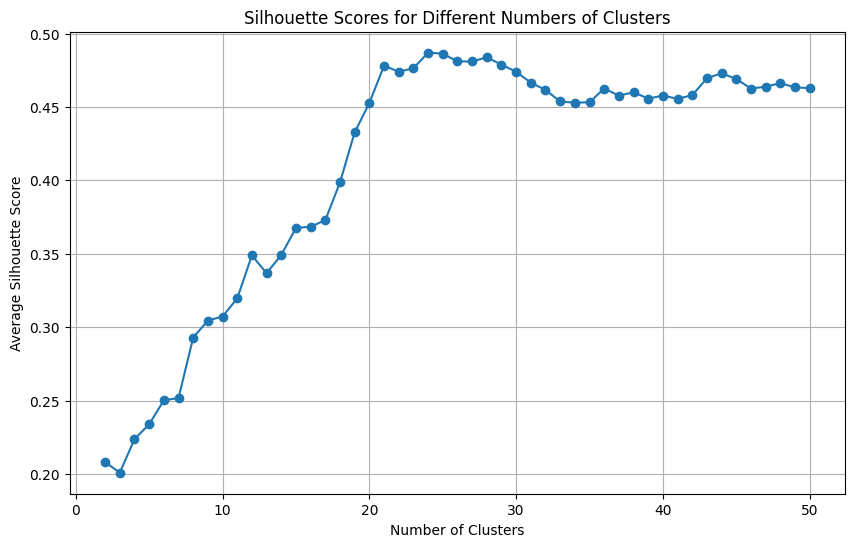

The optimal number of clusters is 24 with a silhouette score of 0.4869.


In [120]:
clusters, scores = zip(*silhouette_avgs)
plt.figure(figsize=(10, 6))
plt.plot(clusters, scores, marker='o')
plt.title("Silhouette Scores for Different Numbers of Clusters")
plt.xlabel("Number of Clusters")
plt.ylabel("Average Silhouette Score")
plt.grid(True)
plt.show()

# Find and print the optimal number of clusters
optimal_clusters = clusters[np.argmax(scores)]
print(f"The optimal number of clusters is {optimal_clusters} with a silhouette score of {max(scores):.4f}.")

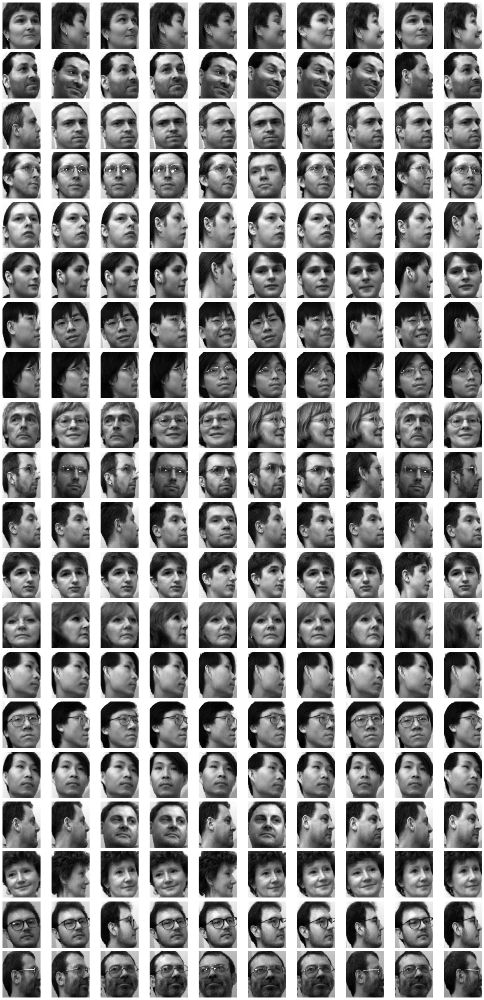

In [121]:
def group_images_by_cluster(images, cluster_labels):
    clusters = {}
    for idx, cluster in enumerate(cluster_labels):
        if cluster not in clusters:
            clusters[cluster] = []
        clusters[cluster].append(images[idx])
    return clusters

clusters = group_images_by_cluster(train_images, cluster_labels)

def plot_clusters(clusters, images_per_cluster=10):
    num_clusters = len(clusters)
    fig, axes = plt.subplots(num_clusters, images_per_cluster, figsize=(images_per_cluster * 2, num_clusters * 2))
    for cluster_id, image_list in clusters.items():
        for i in range(min(len(image_list), images_per_cluster)):
            ax = axes[cluster_id, i] if num_clusters > 1 else axes[i]
            ax.imshow(image_list[i], cmap='gray')
            ax.axis('off')
        for j in range(len(image_list), images_per_cluster):
            ax = axes[cluster_id, j] if num_clusters > 1 else axes[j]
            ax.axis('off')
    plt.tight_layout()
    plt.show()

plot_clusters(clusters, images_per_cluster=10)


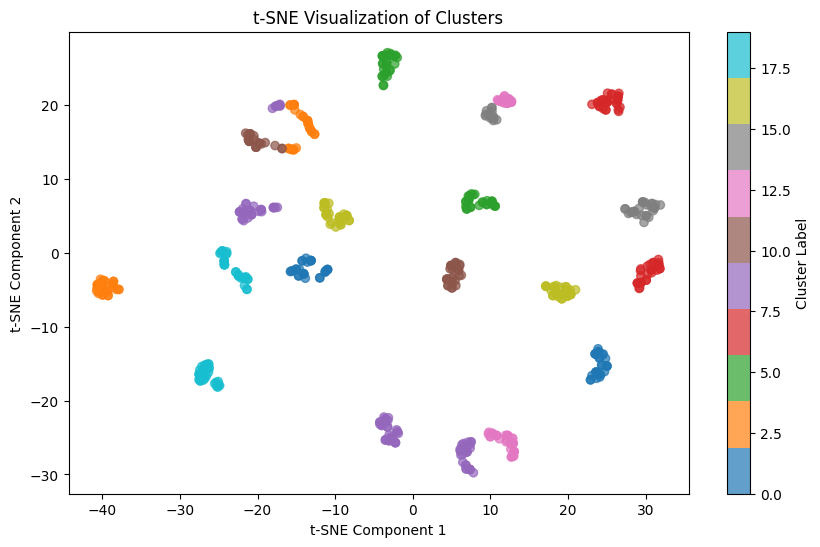

In [ ]:
from sklearn.manifold import TSNE

# Perform t-SNE
tsne = TSNE(n_components=2, random_state=32)
tsne_embeddings = tsne.fit_transform(train_embeddings)

plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    tsne_embeddings[:, 0],
    tsne_embeddings[:, 1],
    c=cluster_labels,
    cmap="tab10",
    alpha=0.7,
)
plt.colorbar(scatter, label="Cluster Label")
plt.title("t-SNE Visualization of Clusters")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.show()


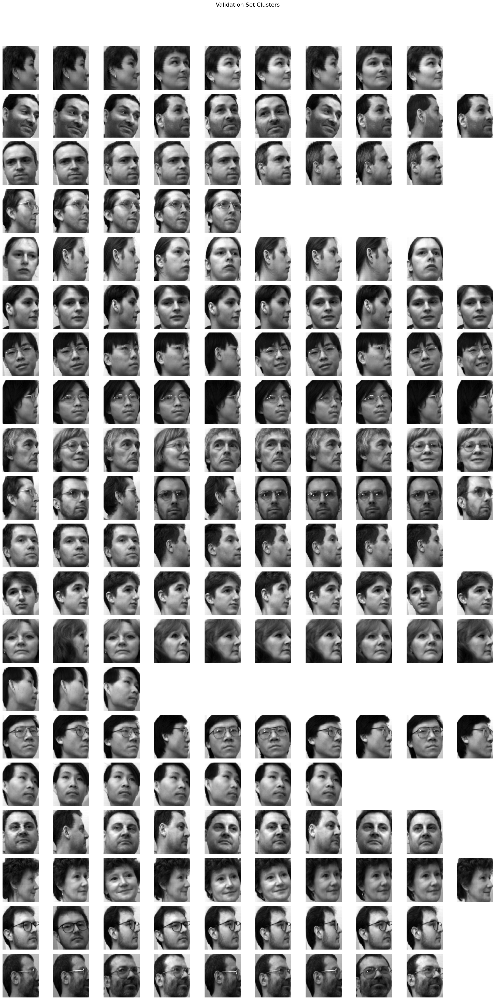

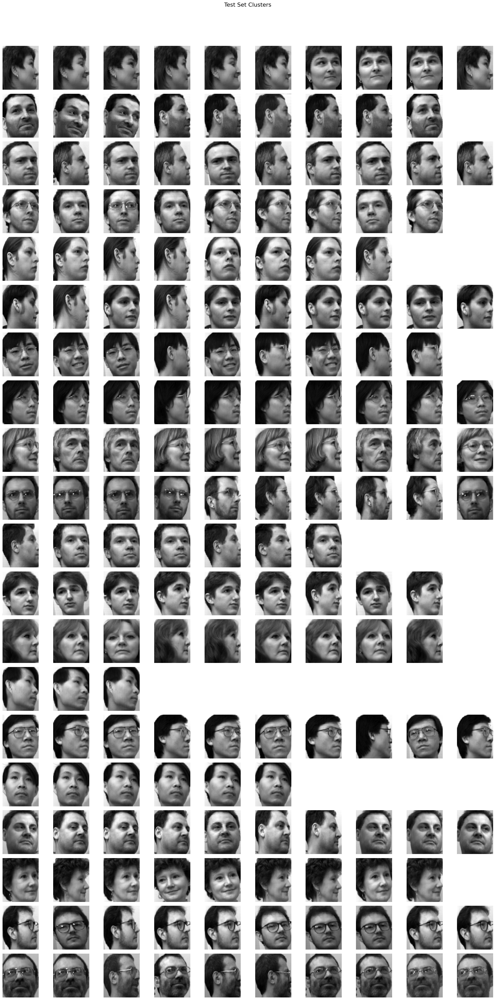

In [ ]:
# Group images by cluster
def group_images_by_cluster(images, cluster_labels):
    clusters = {}
    for idx, cluster in enumerate(cluster_labels):
        if cluster not in clusters:
            clusters[cluster] = []
        clusters[cluster].append(images[idx])
    return clusters

def plot_clusters_with_title(clusters, images_per_cluster=10, title="Cluster Visualization"):
    num_clusters = len(clusters)
    fig, axes = plt.subplots(num_clusters, images_per_cluster, figsize=(images_per_cluster * 2, num_clusters * 2))
    for cluster_id, image_list in clusters.items():
        for i in range(min(len(image_list), images_per_cluster)):
            ax = axes[cluster_id, i] if num_clusters > 1 else axes[i]
            ax.imshow(image_list[i].squeeze(), cmap='gray')
            ax.axis('off')
        for j in range(len(image_list), images_per_cluster):
            ax = axes[cluster_id, j] if num_clusters > 1 else axes[j]
            ax.axis('off')
    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

val_cluster_labels = kmeans.predict(val_embeddings) 
test_cluster_labels = kmeans.predict(test_embeddings) 

val_clusters = group_images_by_cluster(val_images, val_cluster_labels)  
test_clusters = group_images_by_cluster(test_images, test_cluster_labels)  

plot_clusters_with_title(val_clusters, images_per_cluster=10, title="Validation Set Clusters")
plot_clusters_with_title(test_clusters, images_per_cluster=10, title="Test Set Clusters")


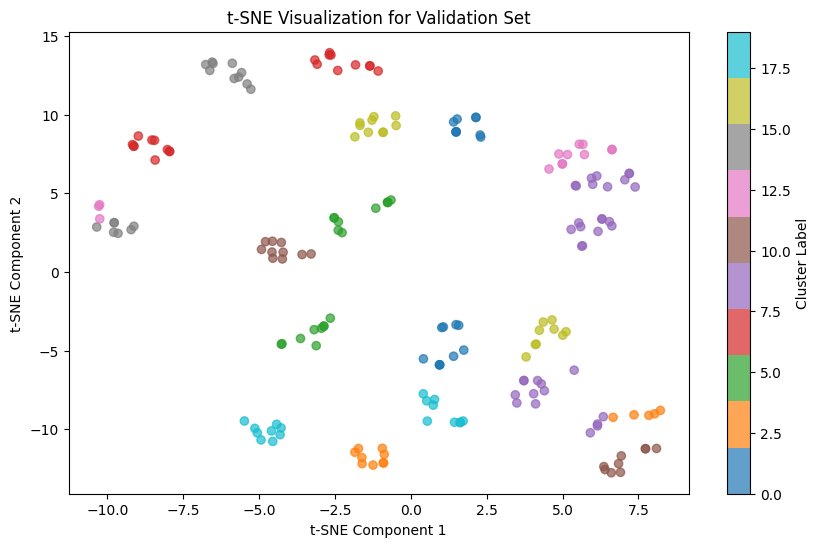

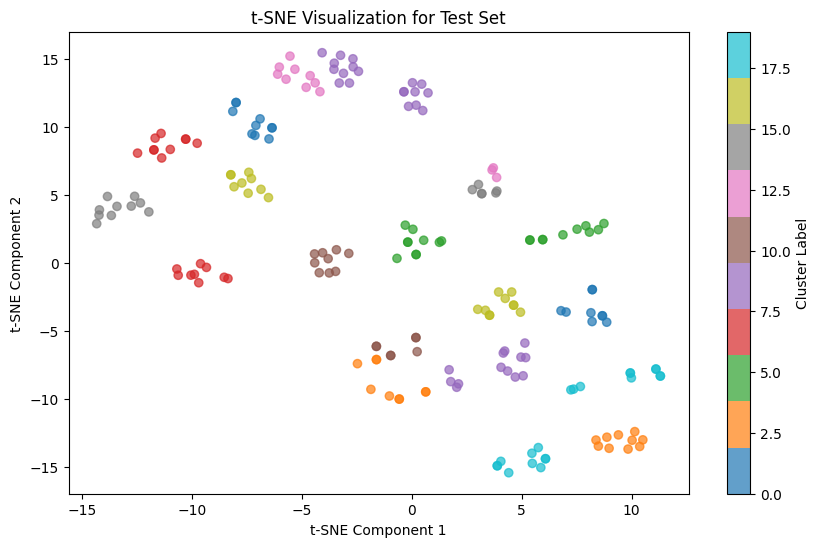

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def plot_tsne(embeddings, labels, title="t-SNE Visualization"):
    tsne = TSNE(n_components=2, random_state=32, perplexity=30)
    tsne_results = tsne.fit_transform(embeddings)
    
    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(
        tsne_results[:, 0], tsne_results[:, 1], c=labels, cmap="tab10", alpha=0.7
    )
    plt.colorbar(scatter, label="Cluster Label")
    plt.title(title)
    plt.xlabel("t-SNE Component 1")
    plt.ylabel("t-SNE Component 2")
    plt.show()

val_labels = kmeans.predict(val_embeddings)
test_labels = kmeans.predict(test_embeddings)

plot_tsne(val_embeddings, val_labels, title="t-SNE Visualization for Validation Set")
plot_tsne(test_embeddings, test_labels, title="t-SNE Visualization for Test Set")
